# Testing Dataloader and Justifying Training Data

## Connecting to Drive, Imports and Helper functions

In [2]:
# connecting drive to colab notebook
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
import sys
sys.path.append('/content/drive/MyDrive/drive_folder')
from custom_dataset_loader import TaiChiDataset, ToTensor
from __future__ import print_function, division
import os
import torch
import pandas as pd
from skimage import io, transform
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
import cv2

In [12]:
def show_image(img):
  if torch.is_tensor(img):
    img=img.permute(1, 2, 0).numpy()
  img = cv2.resize(img, (640, 360)) # resizing image
  plt.imshow(img)
  plt.show()

def show_coords(coords, vis):
  vis = vis > 0
  plt.scatter(coords[:, 0], coords[:, 1], s=0.5, marker='.', c=vis, cmap=plt.cm.coolwarm)
  plt.ylim(max(plt.ylim()), min(plt.ylim()))
  plt.pause(0.001)  # pause a bit so that plots are updated
  

# function to show dataset
def show_sample(sample):
  print("sample id:", sample['id'])
  show_image(sample['image0'])
  if len(sample)==5:
    show_image(sample['image1'])
  show_coords(sample['coords'].squeeze(), sample['vis'].squeeze())

def show_batch(ids_batch, img0_batch, coords_batch, vis_batch, img1_batch=[]):
  for i in range(len(ids_batch)):
      print("sample id:", ids_batch[i])
      show_image(img0_batch[i])
      if len(img1_batch)>0:
        show_image(img1_batch[i])
      show_coords(coords_batch[i].squeeze(), vis_batch[i].squeeze())

## Loading training data

In [16]:
TRAIN_DATA = "training_data_2023-01-10"
!unzip -d "$TRAIN_DATA"/ /content/drive/MyDrive/"$TRAIN_DATA".zip # unziping training data

# Load dataset
dataset = TaiChiDataset(log_file=TRAIN_DATA+'/sample_ids.txt',
                        root_dir=TRAIN_DATA,
                        check=True,
                        transform=ToTensor()
                        )

print(len(dataset))

Archive:  /content/drive/MyDrive/training_data_2023-01-10.zip
replace training_data_2023-01-10/sample_ids.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
563


In [15]:
TRAIN_DATA = "training_data_2023-01-02"
!unzip -d "$TRAIN_DATA"/ /content/drive/MyDrive/"$TRAIN_DATA".zip # unziping training data

# Load dataset 2
dataset2 = TaiChiDataset(log_file=TRAIN_DATA+'/sample_ids.txt',
                        root_dir=TRAIN_DATA,
                        check=True,
                        transform=ToTensor()
                        )

print(len(dataset2)) 

Archive:  /content/drive/MyDrive/training_data_2023-01-02.zip
replace training_data_2023-01-02/coords/asL3ZyuNeB0_1392.npy? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
N
4838


sample id: -CR4xjdQbkc_792


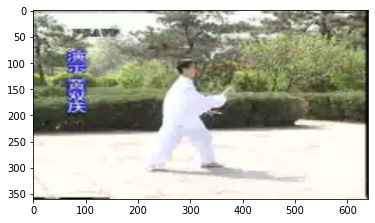

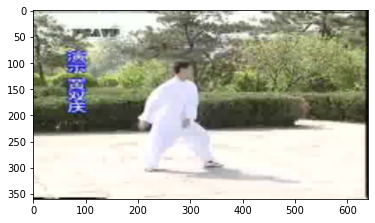

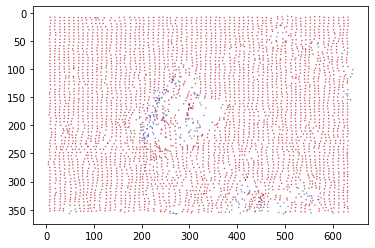

In [18]:
show_sample(dataset[0])

## Displaying dataset

### Random batch

sample id: vB8XTJfV4rY_1152


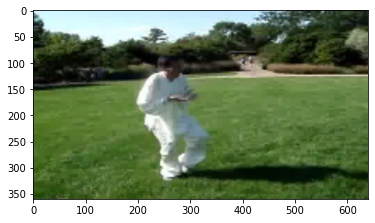

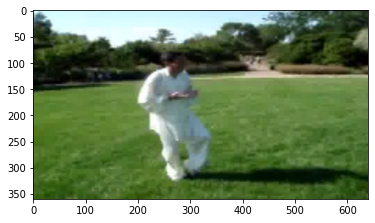

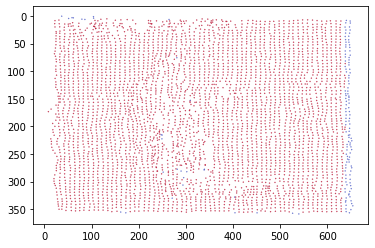

sample id: vB8XTJfV4rY_2128


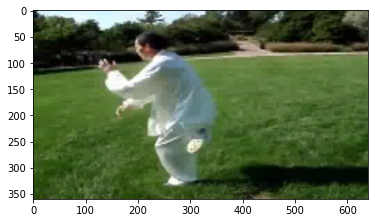

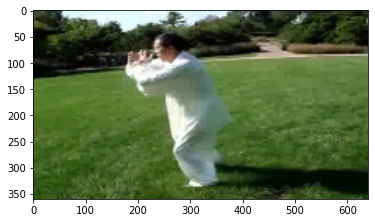

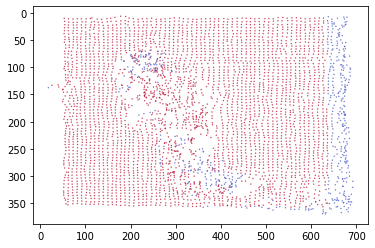

sample id: -CR4xjdQbkc_1552


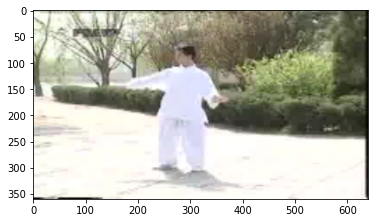

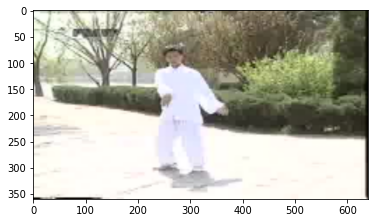

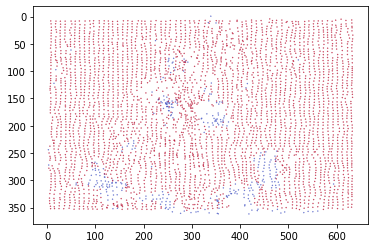

sample id: vB8XTJfV4rY_1224


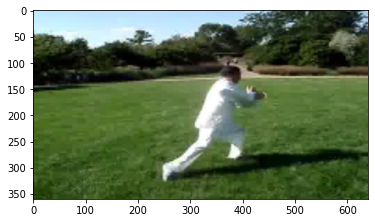

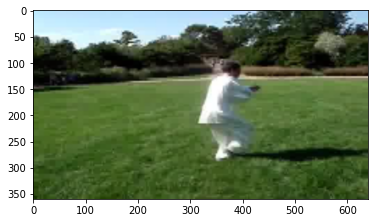

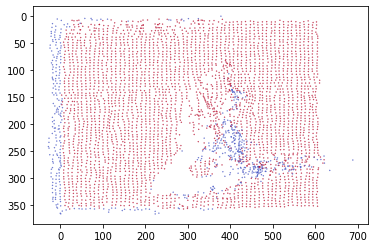

sample id: -CR4xjdQbkc_888


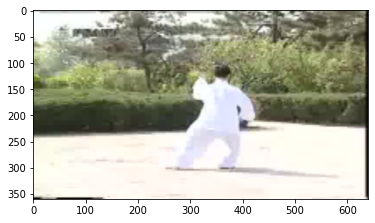

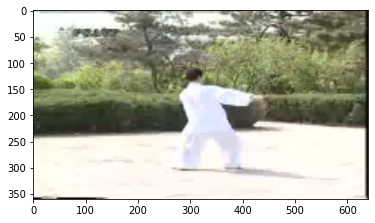

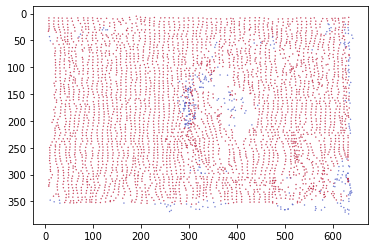

sample id: vB8XTJfV4rY_2256


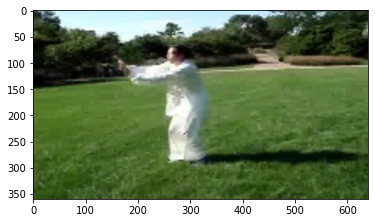

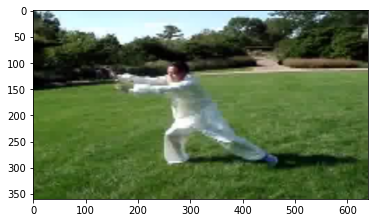

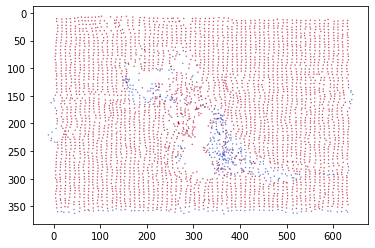

sample id: vB8XTJfV4rY_2800


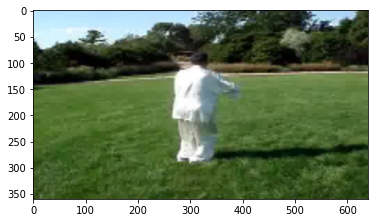

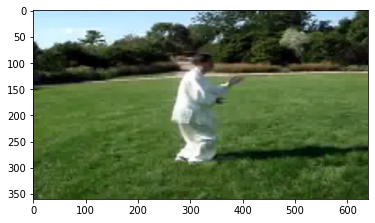

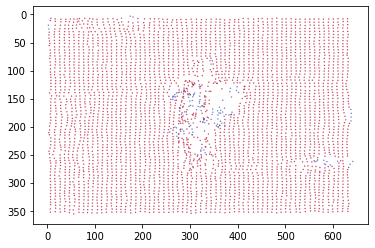

sample id: vB8XTJfV4rY_2872


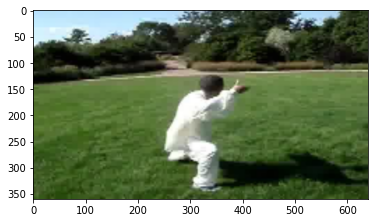

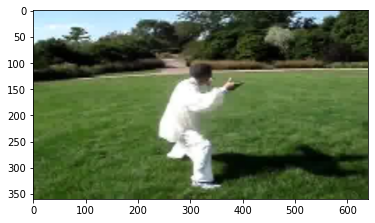

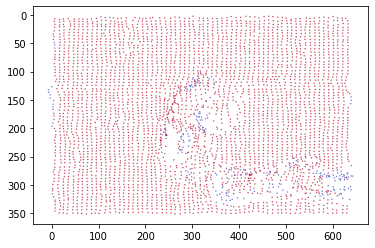

sample id: vB8XTJfV4rY_3032


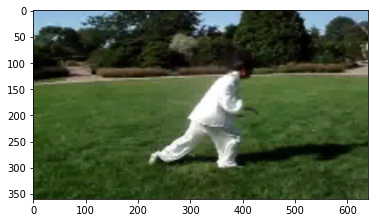

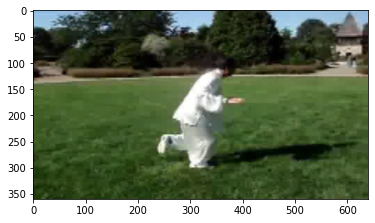

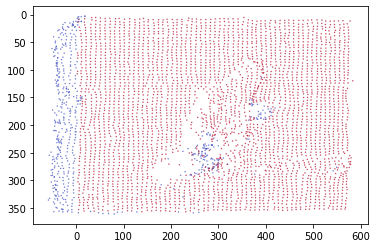

sample id: -CR4xjdQbkc_2040


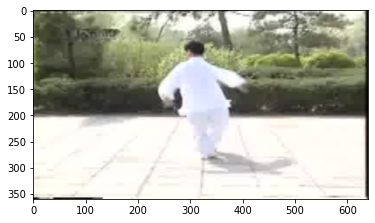

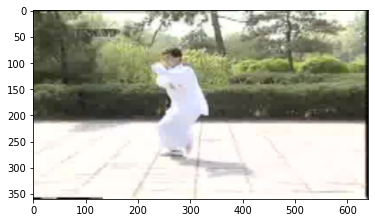

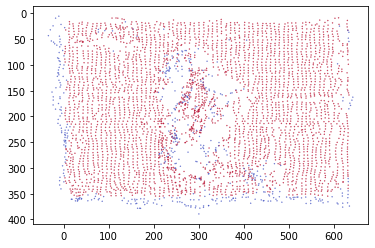

sample id: -CR4xjdQbkc_1936


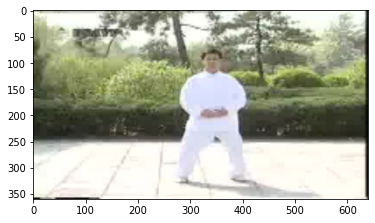

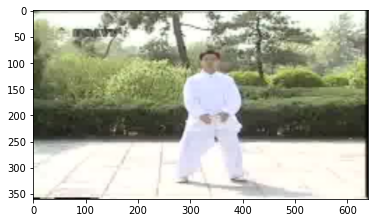

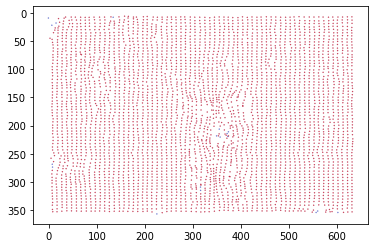

sample id: vB8XTJfV4rY_2376


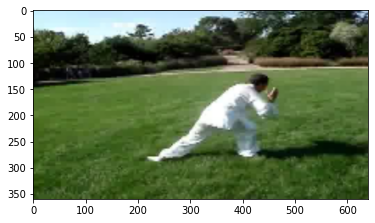

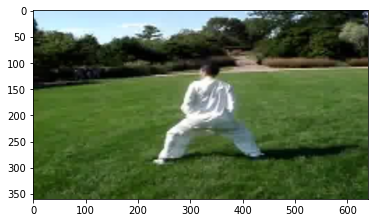

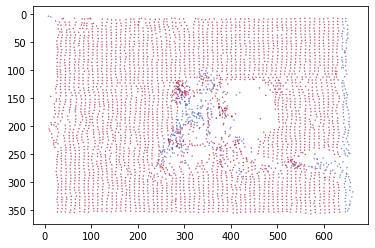

sample id: vB8XTJfV4rY_1512


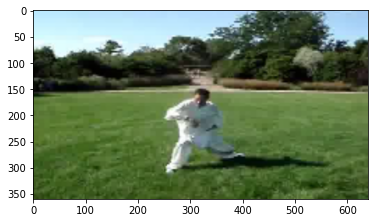

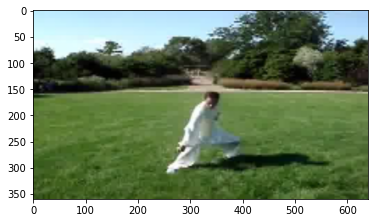

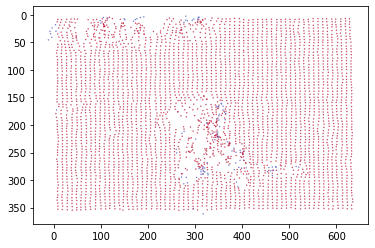

sample id: -CR4xjdQbkc_1208


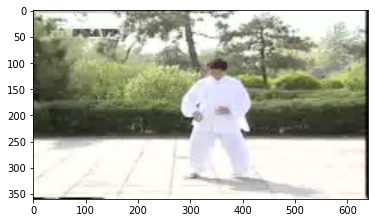

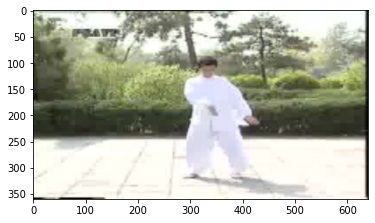

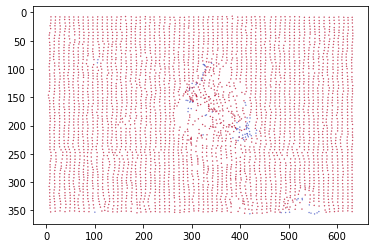

sample id: vB8XTJfV4rY_2224


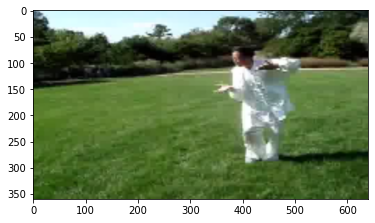

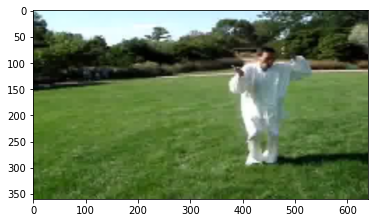

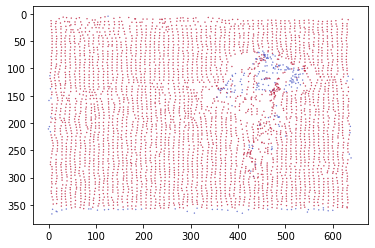

sample id: vB8XTJfV4rY_3088


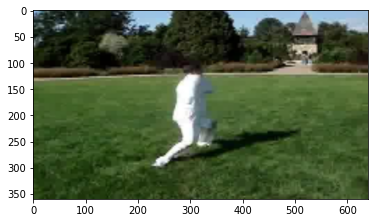

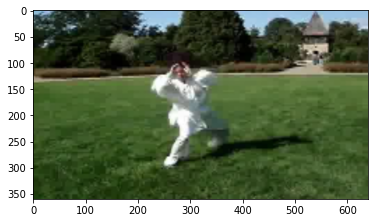

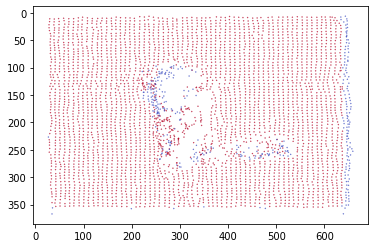

sample id: vB8XTJfV4rY_2536


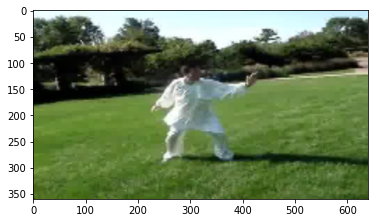

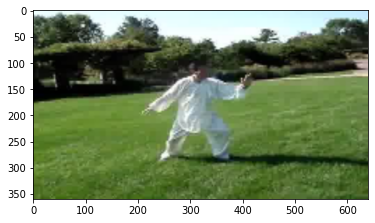

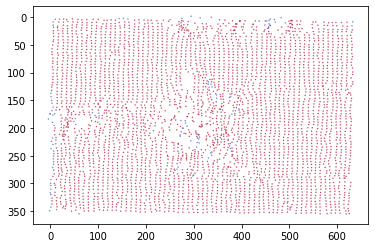

sample id: vB8XTJfV4rY_3320


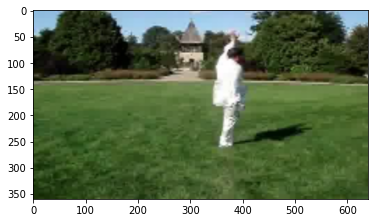

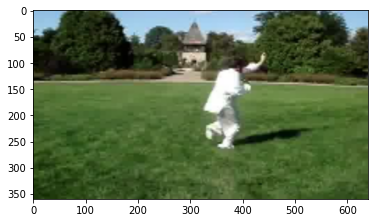

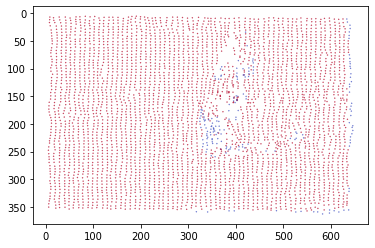

sample id: vB8XTJfV4rY_2808


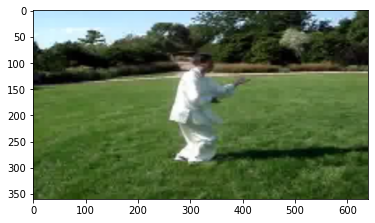

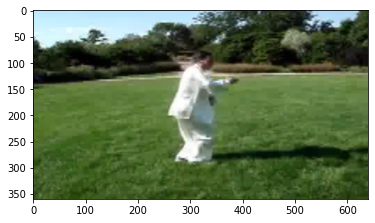

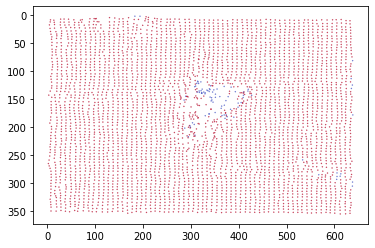

sample id: vB8XTJfV4rY_3392


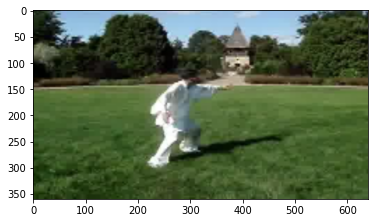

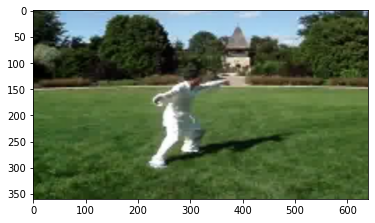

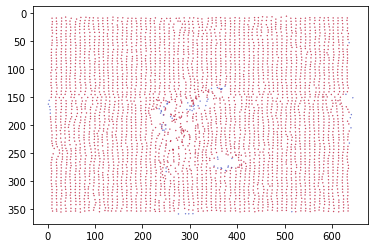

sample id: vB8XTJfV4rY_2320


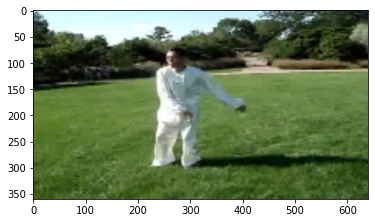

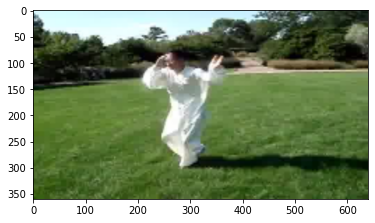

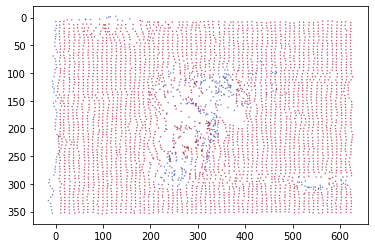

sample id: vB8XTJfV4rY_2992


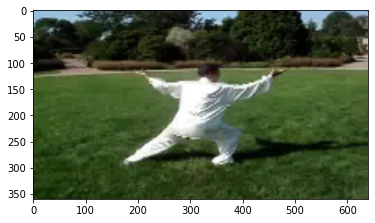

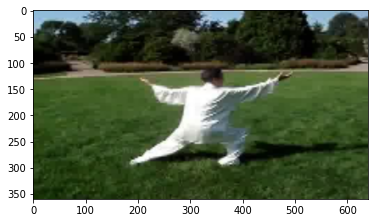

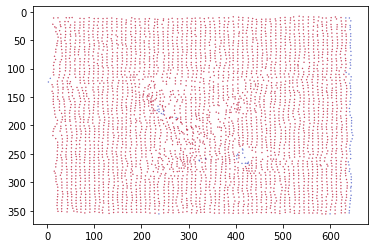

sample id: vB8XTJfV4rY_3376


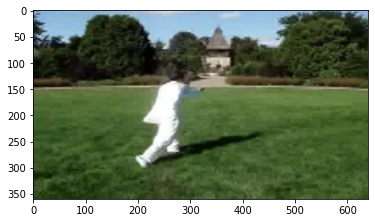

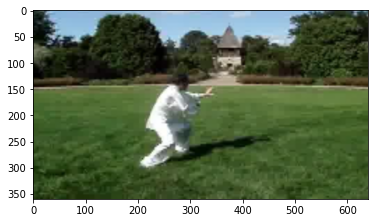

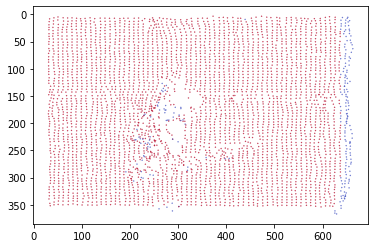

sample id: vB8XTJfV4rY_2912


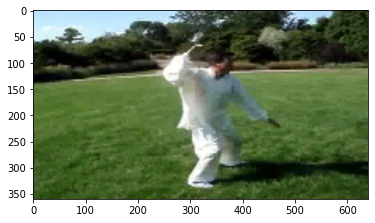

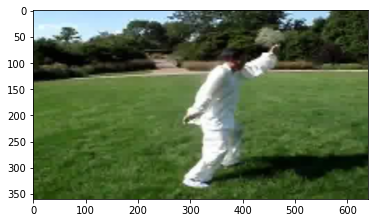

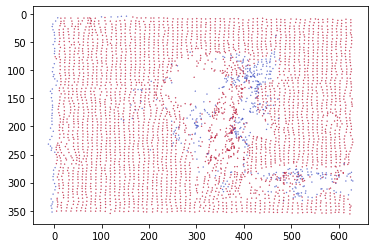

sample id: -CR4xjdQbkc_2384


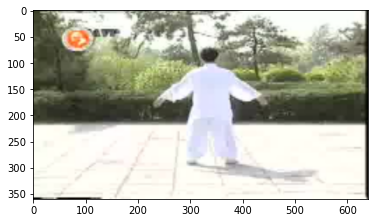

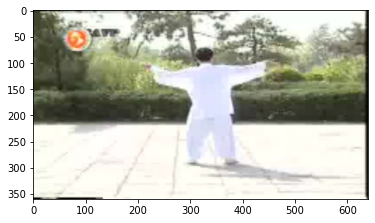

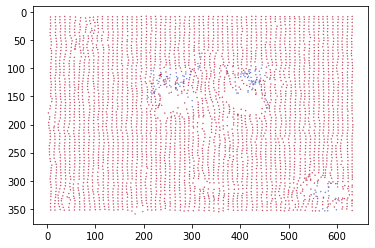

sample id: vB8XTJfV4rY_2520


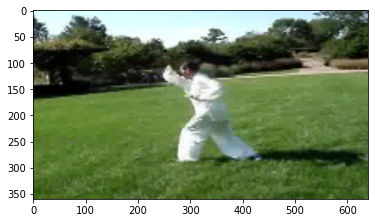

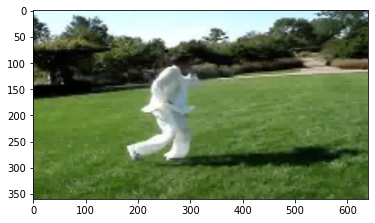

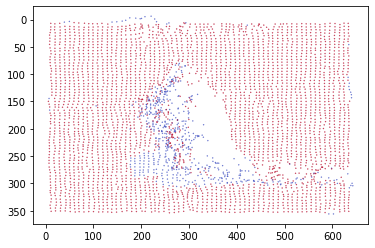

sample id: vB8XTJfV4rY_2464


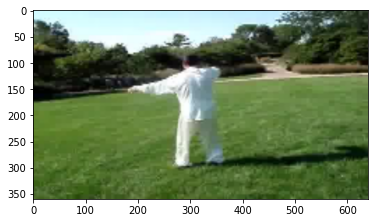

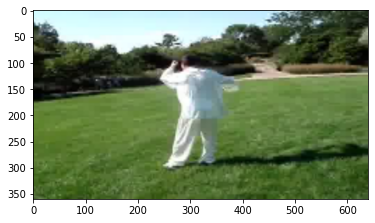

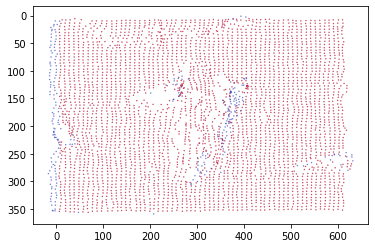

sample id: vB8XTJfV4rY_936


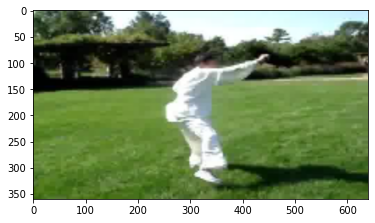

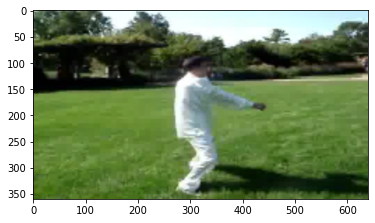

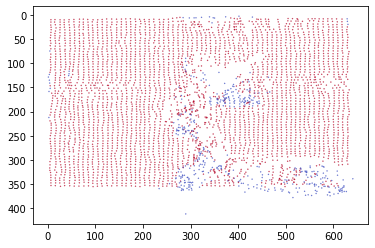

sample id: -CR4xjdQbkc_2288


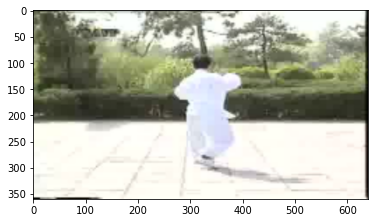

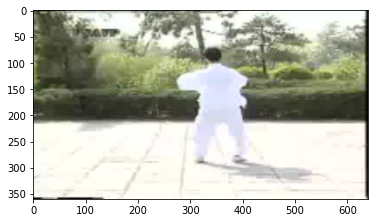

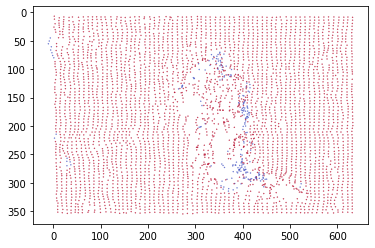

sample id: vB8XTJfV4rY_1816


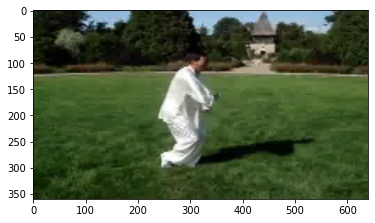

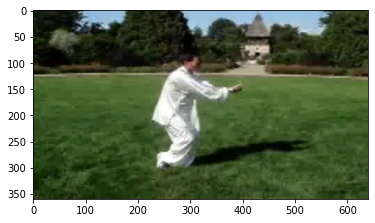

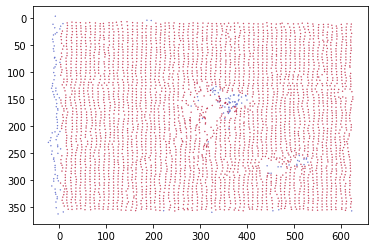

sample id: -CR4xjdQbkc_1816


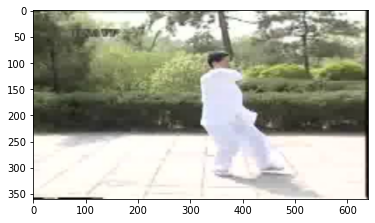

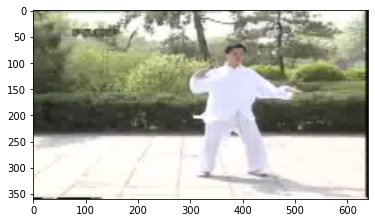

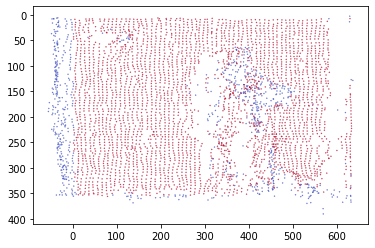

sample id: -CR4xjdQbkc_2256


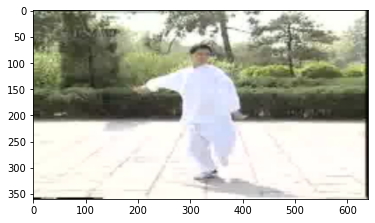

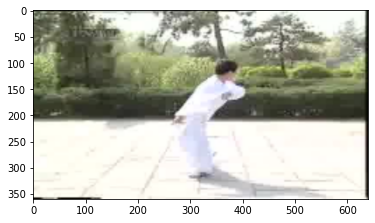

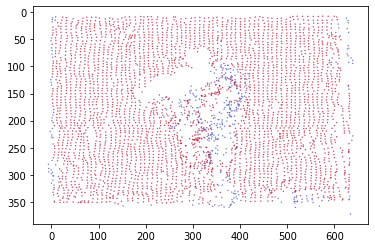

In [19]:
# Show random batch from the dataset
dataloader = DataLoader(dataset, batch_size=32, shuffle=True, num_workers=0)

for i_batch, sample_batched in enumerate(dataloader):
    # observe 4th batch and stop.
    if i_batch == 4:
      show_batch(sample_batched['id'], sample_batched['image0'], sample_batched['coords'], sample_batched['vis'], img1_batch=sample_batched['image1'])
      break

sample id: FmJ33H476pI_1288


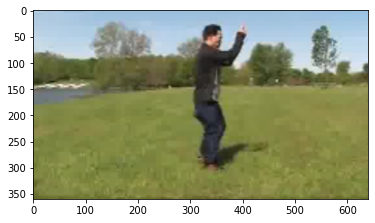

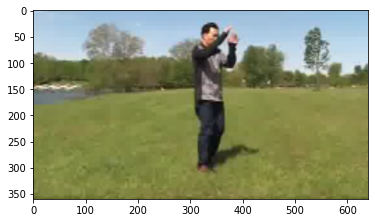

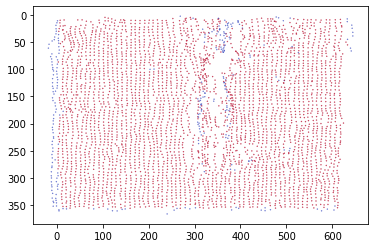

sample id: 6f6nS3PCeQM_896


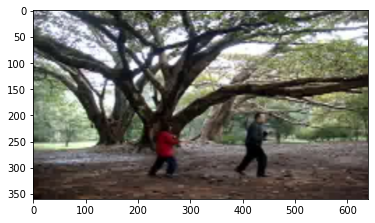

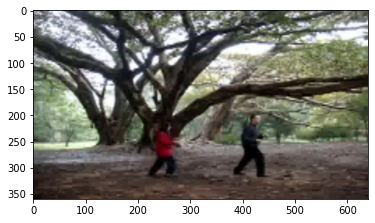

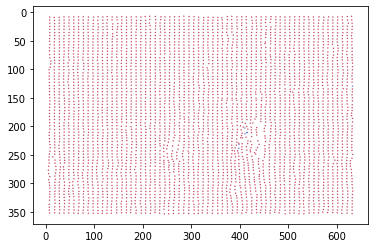

sample id: MGYF1aDwUKg_2152


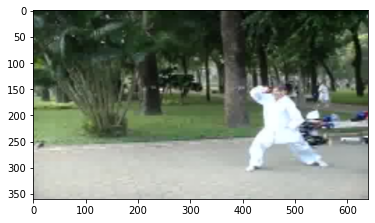

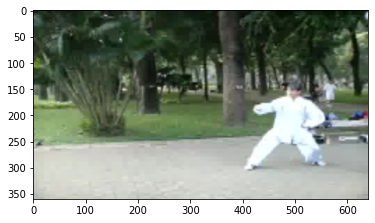

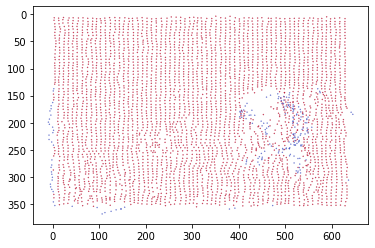

sample id: vB8XTJfV4rY_1752


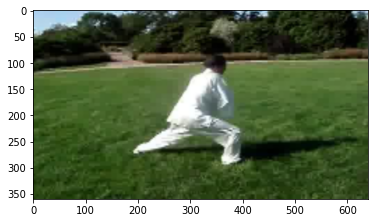

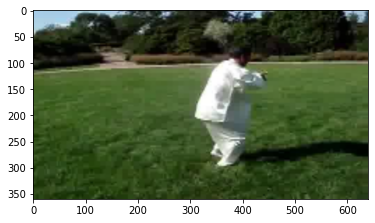

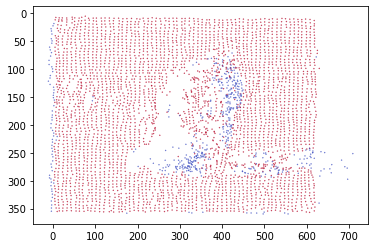

sample id: FmJ33H476pI_5000


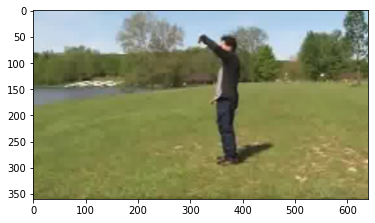

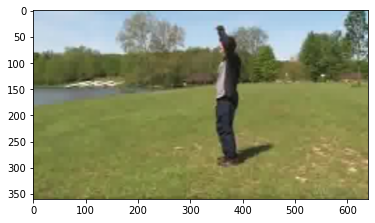

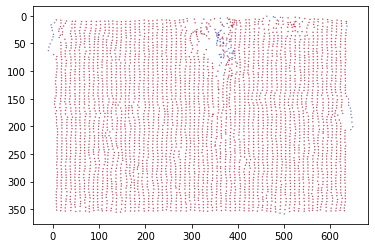

sample id: vB8XTJfV4rY_1360


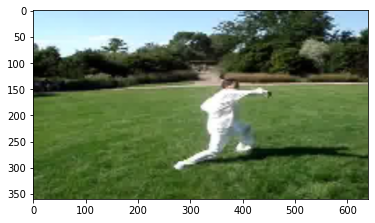

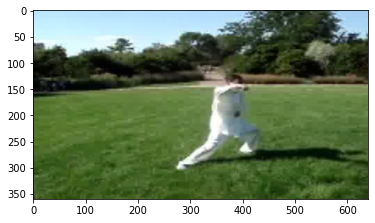

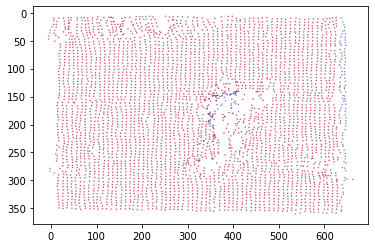

sample id: AUzpWyGi8Gw_856


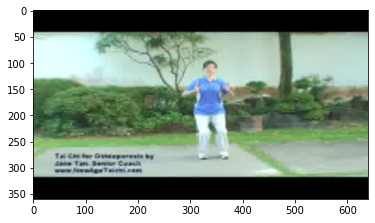

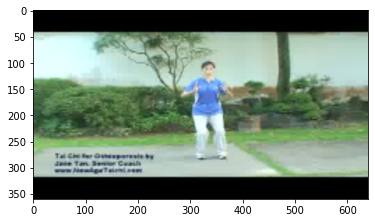

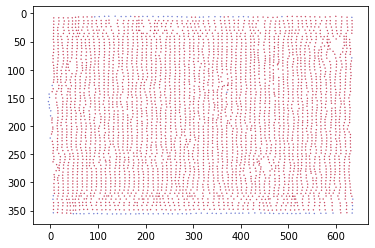

sample id: CA9-8CydW4A_4176


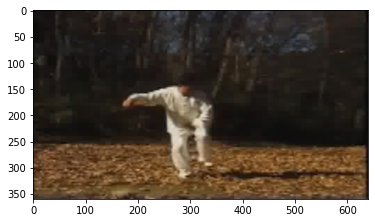

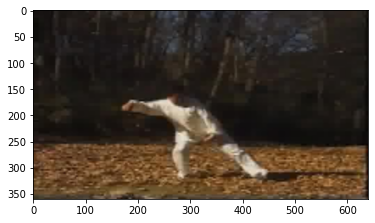

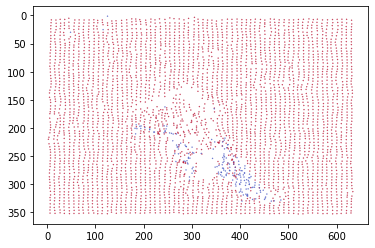

sample id: 8DemshD_8a4_2328


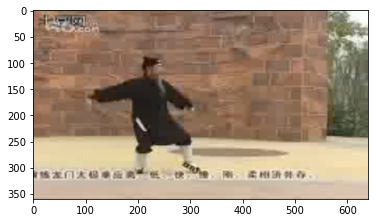

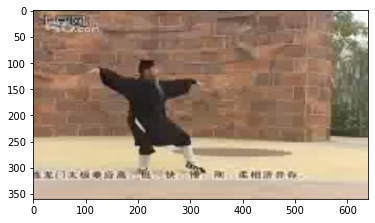

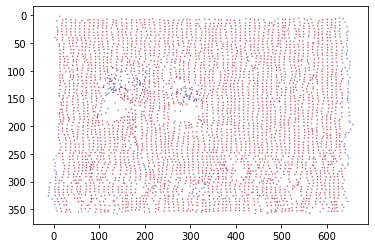

sample id: K7td6IVvS8w_4208


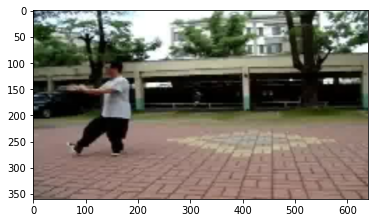

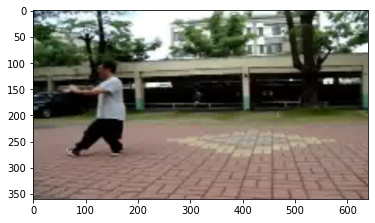

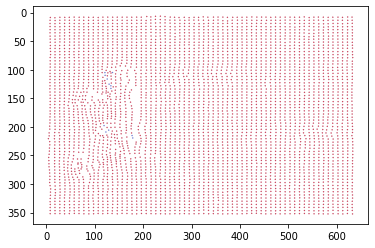

sample id: MGYF1aDwUKg_1952


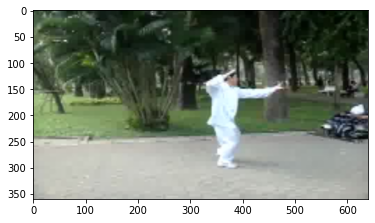

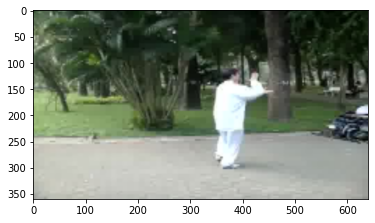

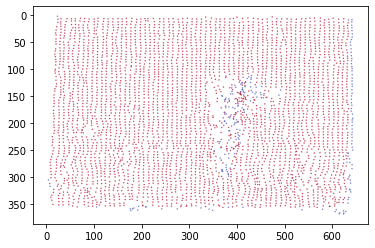

sample id: K7td6IVvS8w_1064


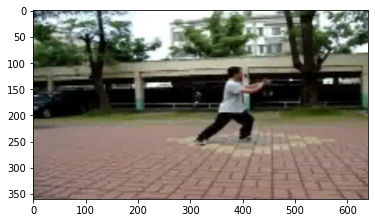

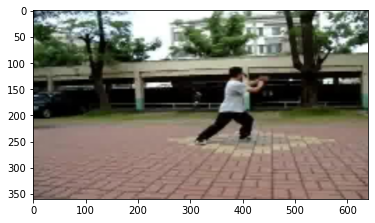

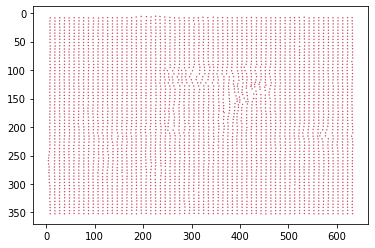

sample id: 8DemshD_8a4_1768


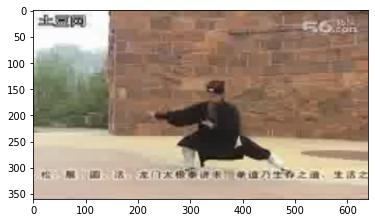

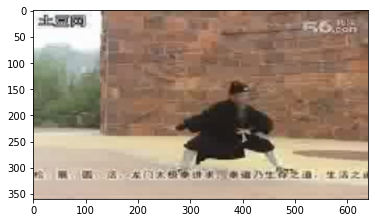

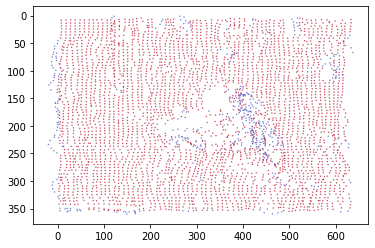

sample id: K7td6IVvS8w_3304


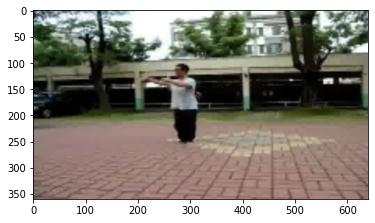

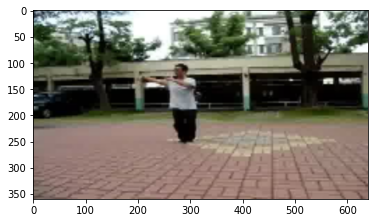

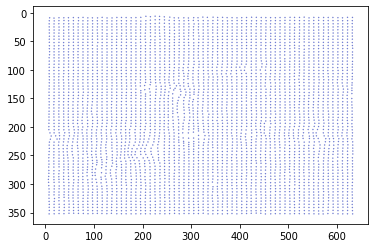

sample id: -CR4xjdQbkc_1912


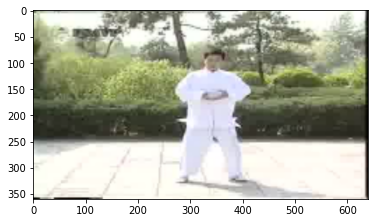

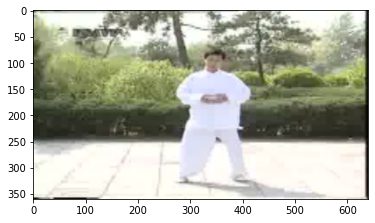

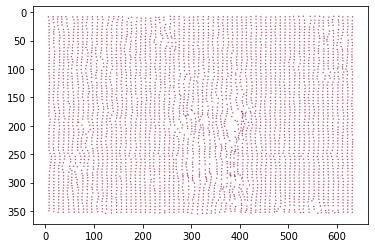

sample id: -CR4xjdQbkc_1056


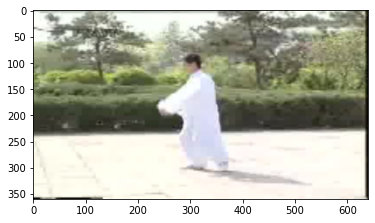

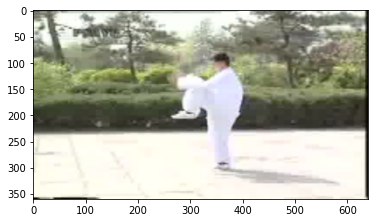

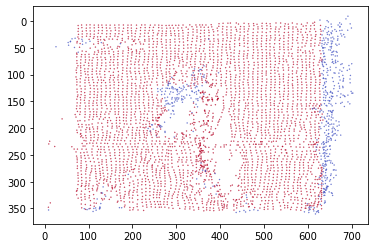

sample id: 8DemshD_8a4_1032


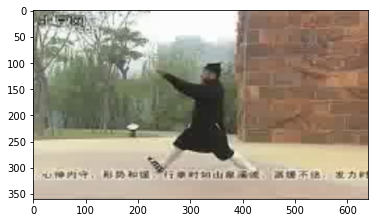

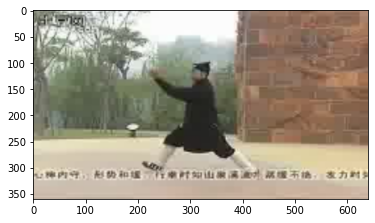

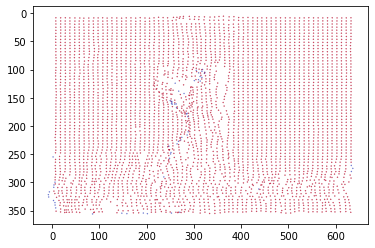

sample id: CA9-8CydW4A_4016


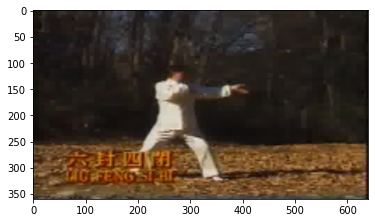

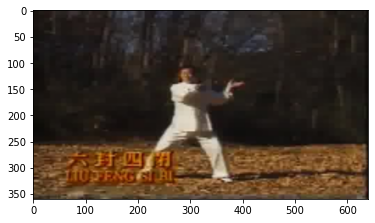

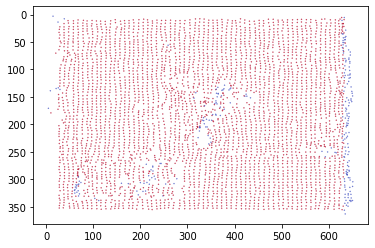

sample id: 3zIcD0hIpfc_816


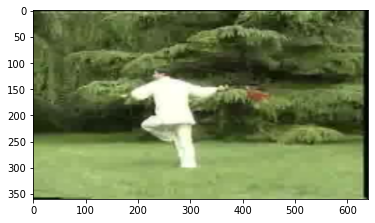

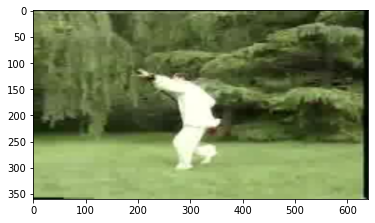

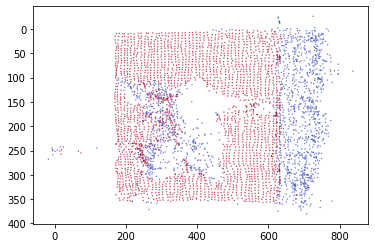

sample id: MGYF1aDwUKg_1720


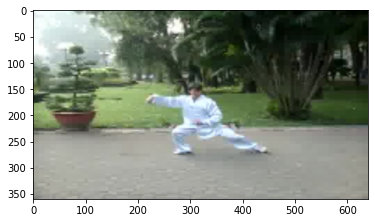

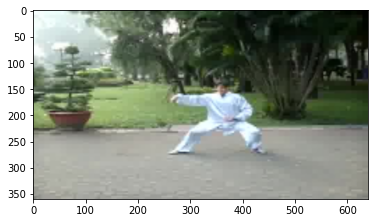

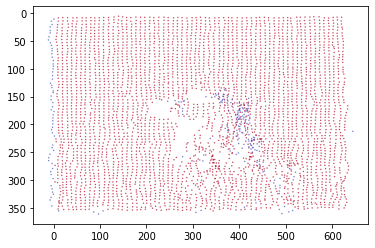

sample id: 8DemshD_8a4_2960


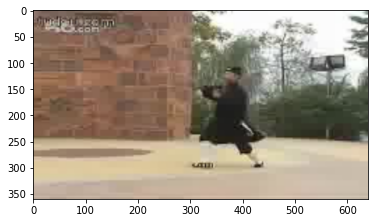

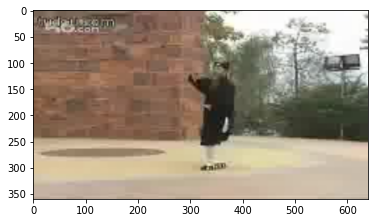

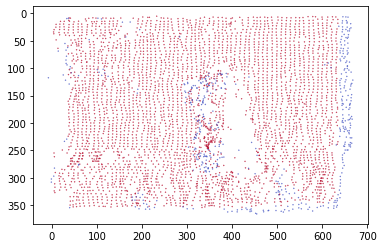

sample id: K7td6IVvS8w_1112


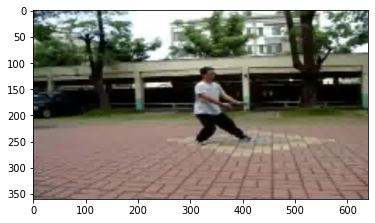

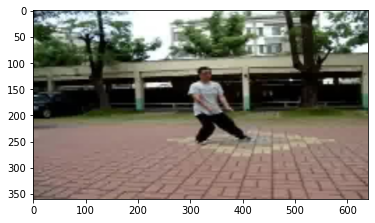

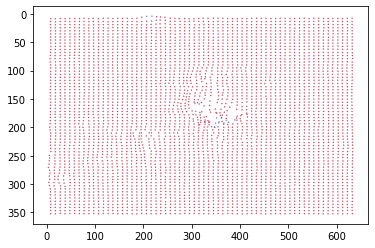

sample id: vB8XTJfV4rY_2352


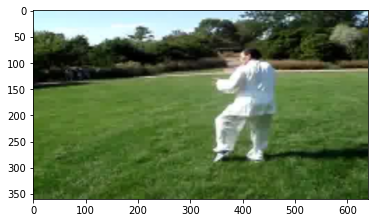

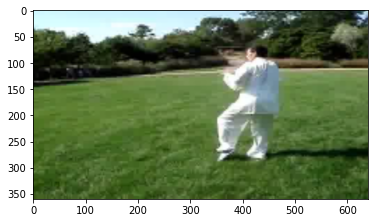

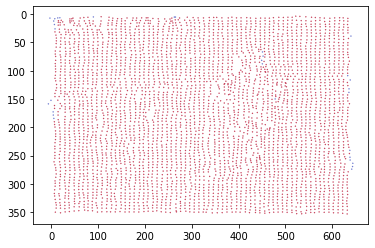

sample id: uOw-z7CR7x8_936


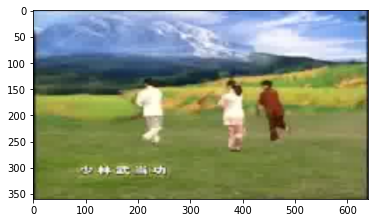

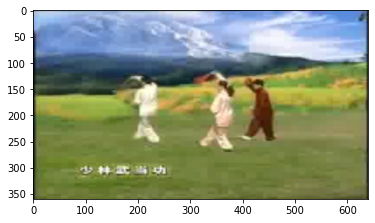

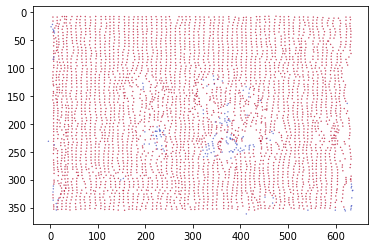

sample id: 6f6nS3PCeQM_1048


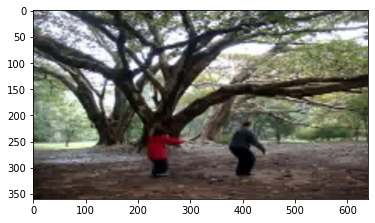

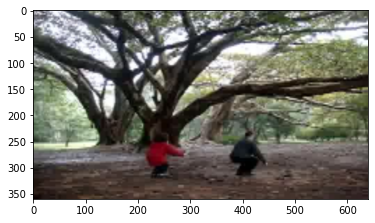

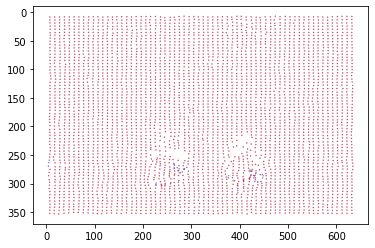

sample id: asL3ZyuNeB0_1184


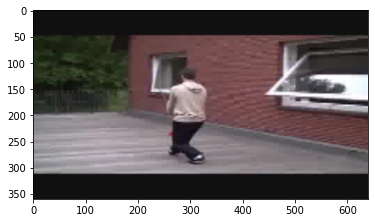

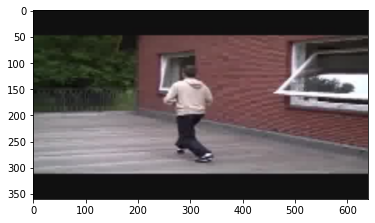

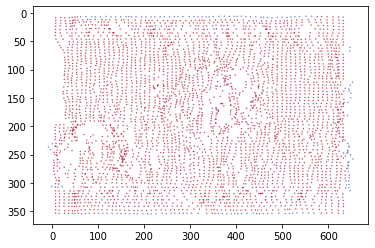

sample id: BtuIV3k5O6Q_1104


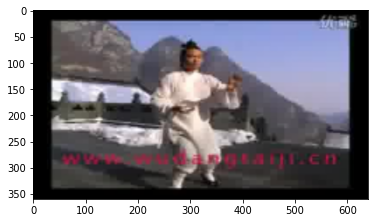

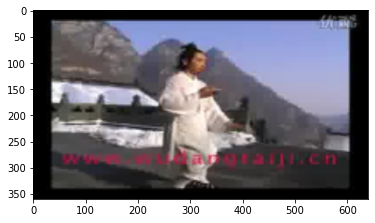

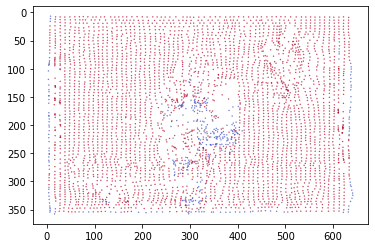

sample id: K7td6IVvS8w_1672


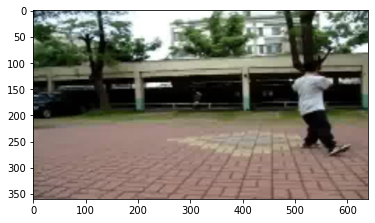

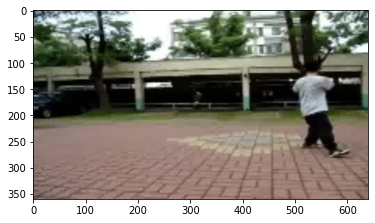

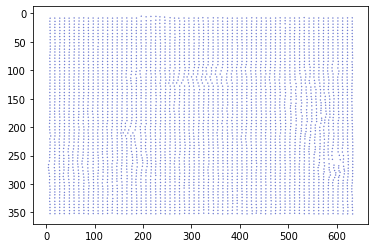

sample id: 6f6nS3PCeQM_3400


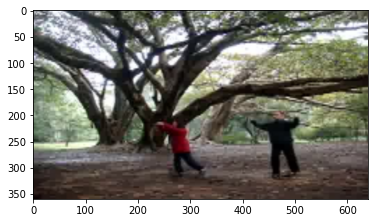

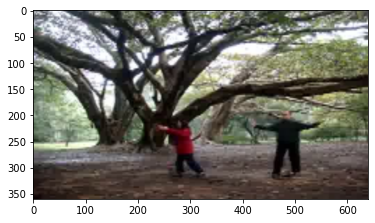

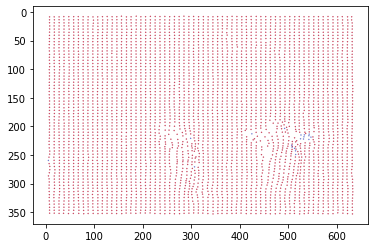

sample id: zxsGZCdT7Ns_2280


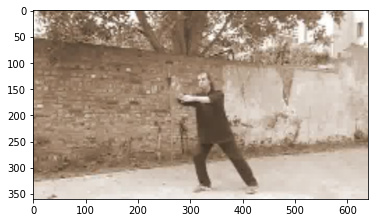

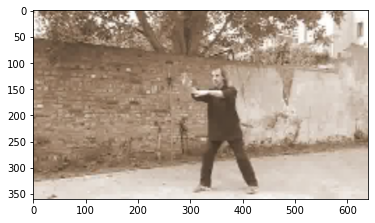

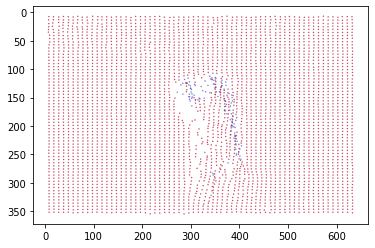

sample id: 8DemshD_8a4_1000


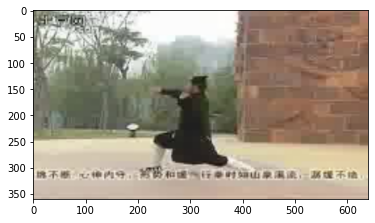

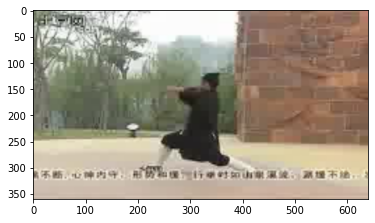

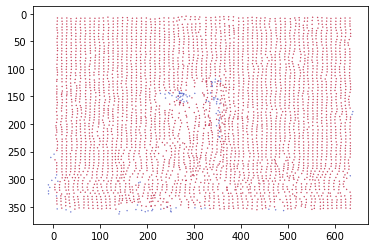

sample id: FmJ33H476pI_3896


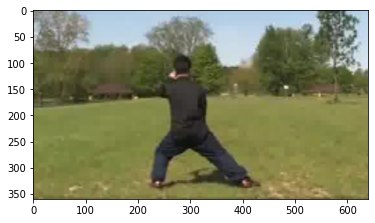

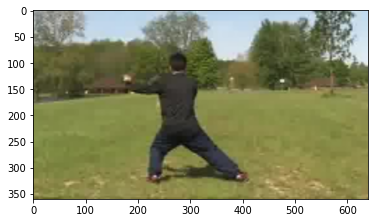

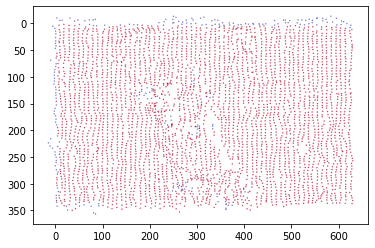

In [21]:
# Show random batch from the dataset
dataloader = DataLoader(dataset2, batch_size=32, shuffle=True, num_workers=0)

for i_batch, sample_batched in enumerate(dataloader):
    # observe 4th batch and stop.
    if i_batch == 4:
      show_batch(sample_batched['id'], sample_batched['image0'], sample_batched['coords'], sample_batched['vis'], img1_batch=sample_batched['image1'])
      break